In [6]:
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from math import sqrt
import math
from numpy import linalg as LA
import matplotlib.pyplot as plt
import healpy as hp
from matplotlib import cm
%matplotlib inline
print('all packages are successfully loaded')
import sys
print('python version: ' + sys.version)
import platform
print('Current OS: ' + platform.platform())

all packages are successfully loaded
python version: 3.5.2 (default, Oct  8 2019, 13:06:37) 
[GCC 5.4.0 20160609]
Current OS: Linux-4.4.0-18362-Microsoft-x86_64-with-Ubuntu-16.04-xenial


# Functions

In [4]:
# Funcion to load map from *.fit file and apply the mask
def load_map(path, NSIDE = 1024, mask = None):
    m =hp.read_map(path)
    if mask is None:
        mask=np.zeros(hp.nside2npix(NSIDE),dtype=np.double)
        pixel_theta,pixel_phi = hp.pix2ang(NSIDE,np.arange(hp.nside2npix(NSIDE))) #pixl coord
        mask[np.logical_or(pixel_theta<(np.pi/2-np.pi/60),(np.pi/2+np.pi/60)<pixel_theta)]=1
    m=m*mask
    hp.mollview(m,unit='mK', norm='hist')
    plt.show()
    return m

In [ ]:
# Function to calculate ILC weight matrix
def get_ilc_weights(m_list):
    m_tuple = tuple(m_list)
    y=np.vstack(m_tuple)
    C = np.cov(y)
    C_inv=np.linalg.inv(C)
    w=np.sum(C_inv,axis=1)/np.sum(C_inv)
    return w

In [12]:
# Function to get final map estimator
def get_final_map(m_list, w):
    m = sum([a*b for a,b in zip(w,m_list)])
    return m

# Load 1024 data

NSIDE = 1024
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 1024
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


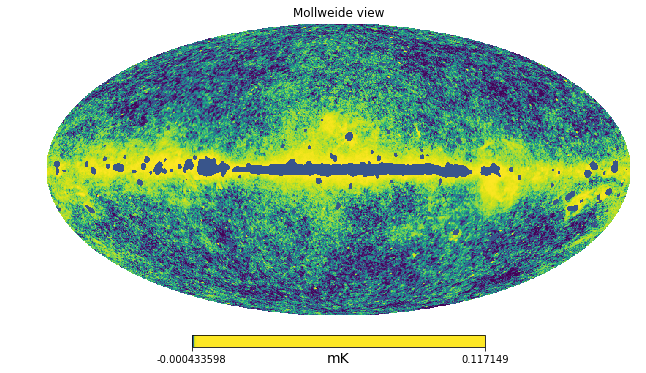

NSIDE = 1024
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


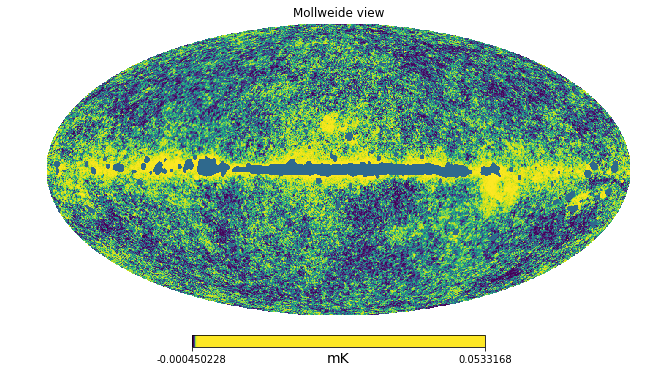

NSIDE = 1024
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


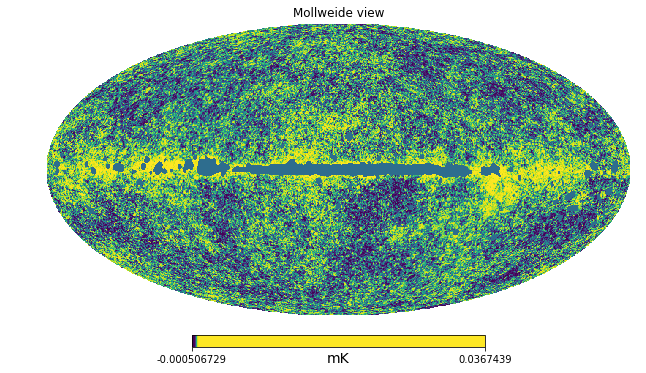

NSIDE = 1024
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


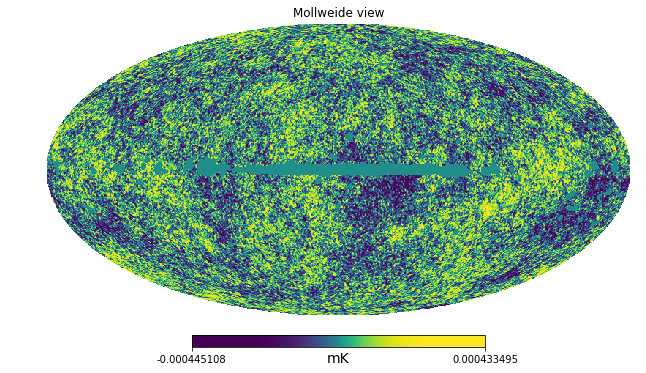

In [22]:
mask = hp.read_map('COM_CMB_IQU-nilc_1024_R2.02_full.fits', field = 3)
m30 = load_map('LFI_SkyMap_030_1024_R2.01_full.fits', mask = mask)
m44 = load_map('LFI_SkyMap_044_1024_R2.01_full.fits', mask = mask)
m70 = load_map('LFI_SkyMap_070_1024_R2.01_full.fits', mask = mask)
m_off = load_map('COM_CMB_IQU-nilc_1024_R2.02_full.fits', mask = mask)

m_1024 = [m30, m44, m70]

# Calculation of 1024 ILC

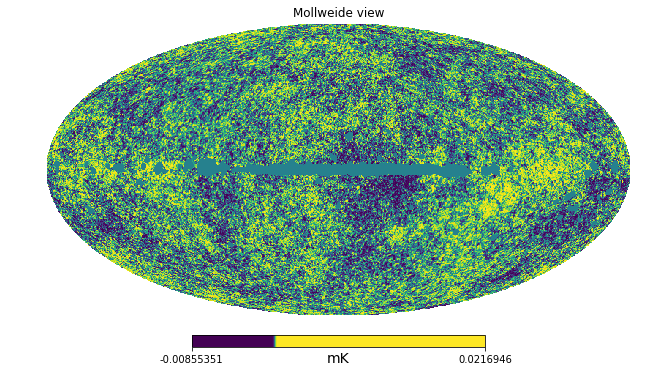

In [23]:
w_1024 = get_ilc_weights(m_1024)

m_f = get_final_map(m_1024, w_1024)
hp.mollview(m_f,unit='mK', norm='hist')
plt.show()

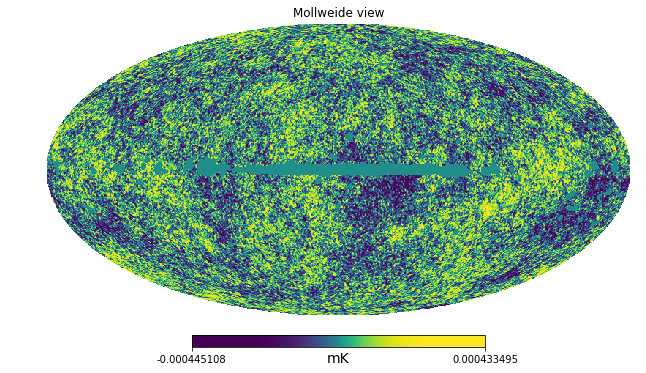

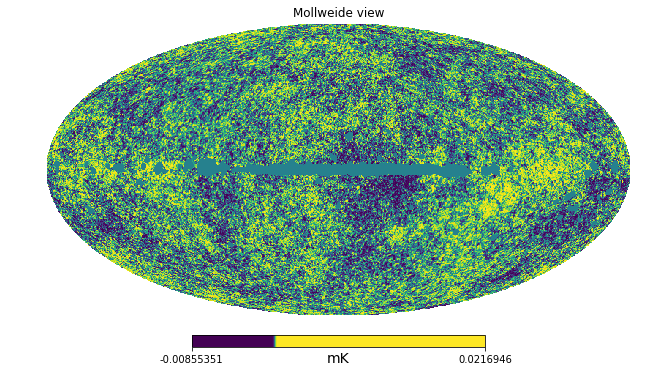

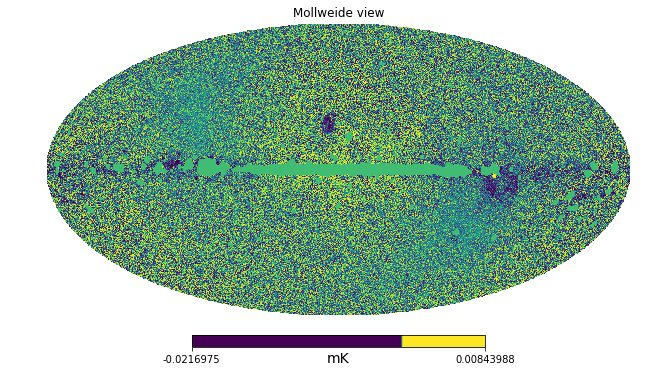

In [24]:
hp.mollview(m_off,unit='mK', norm='hist')
plt.show()
hp.mollview(m_f,unit='mK', norm='hist')
plt.show()
hp.mollview(m_off-m_f,unit='mK', norm='hist')
plt.show()

# Calculation of 2048 ILC

NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


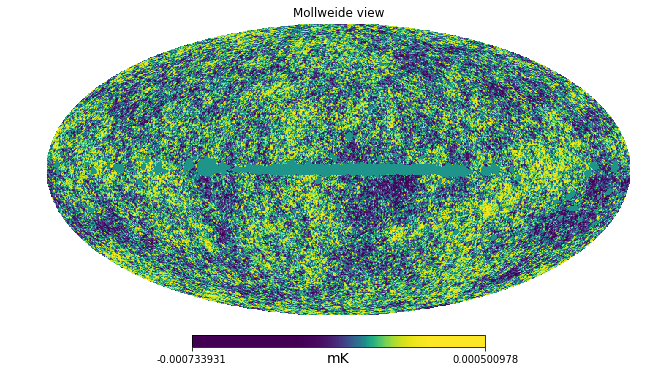

NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


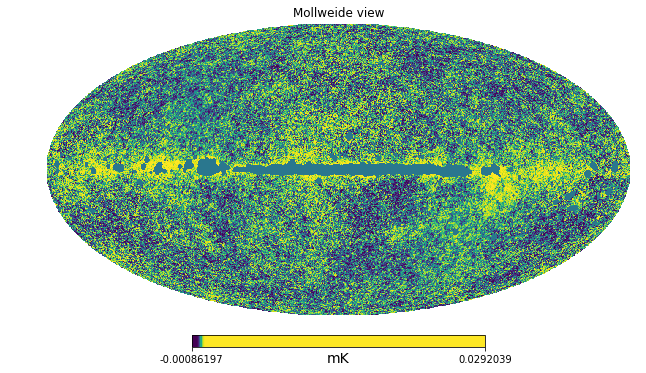

NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


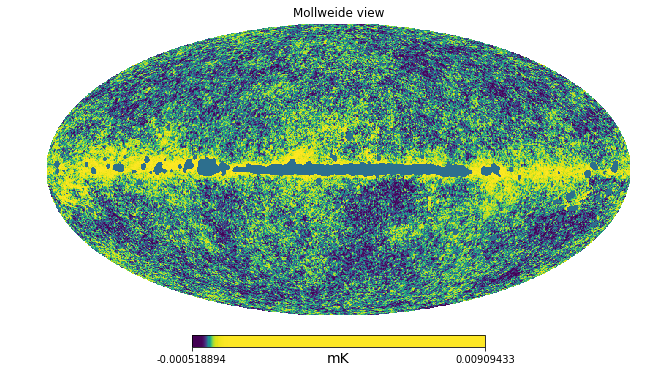

NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


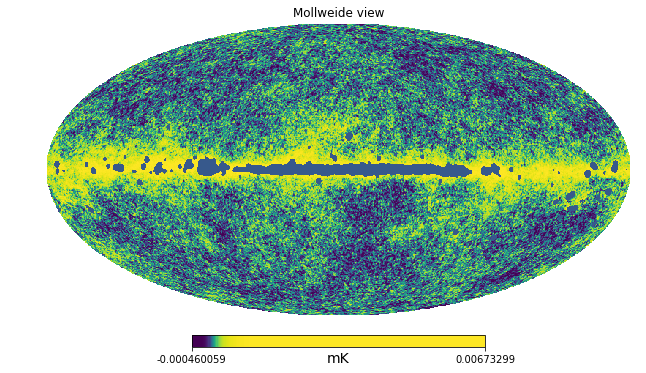

NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


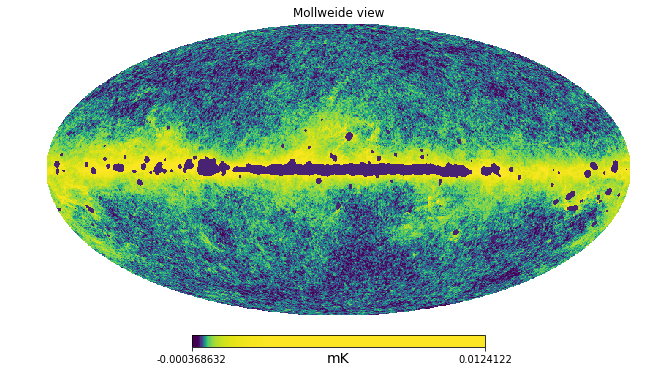

NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


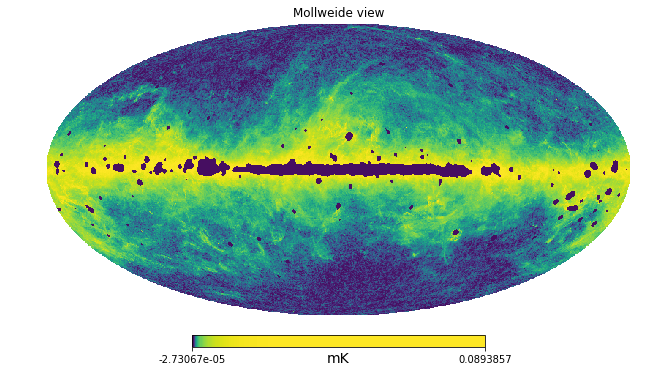

NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


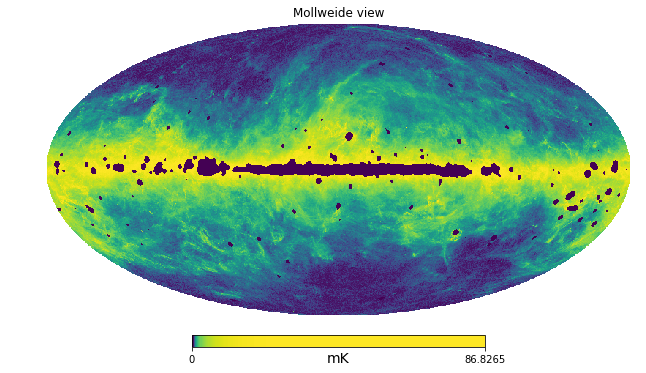

NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


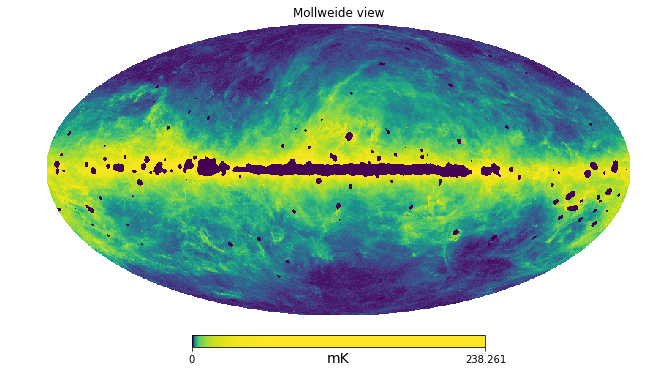

In [25]:
mask2 = hp.read_map('COM_CMB_IQU-nilc-field-Int_2048_R2.01_full.fits', field = 1)
m_off2 = load_map('COM_CMB_IQU-nilc-field-Int_2048_R2.01_full.fits', 2048, mask = mask2)
m70 = load_map('LFI_SkyMap_070_2048_R2.01_full.fits', 2048, mask = mask2)
m100 = load_map('HFI_SkyMap_100_2048_R2.02_full.fits', 2048, mask = mask2)
m143 = load_map('HFI_SkyMap_143_2048_R2.02_full.fits', 2048, mask = mask2)
m217 = load_map('HFI_SkyMap_217_2048_R2.02_full.fits', 2048, mask = mask2)
m353 = load_map('HFI_SkyMap_353_2048_R2.02_full.fits', 2048, mask = mask2)
m545 = load_map('HFI_SkyMap_545_2048_R2.02_full.fits', 2048, mask = mask2)
m857 = load_map('HFI_SkyMap_857_2048_R2.02_full.fits', 2048, mask = mask2)

m_2048 = [m70,m100,m143,m217,m353,m545,m857]

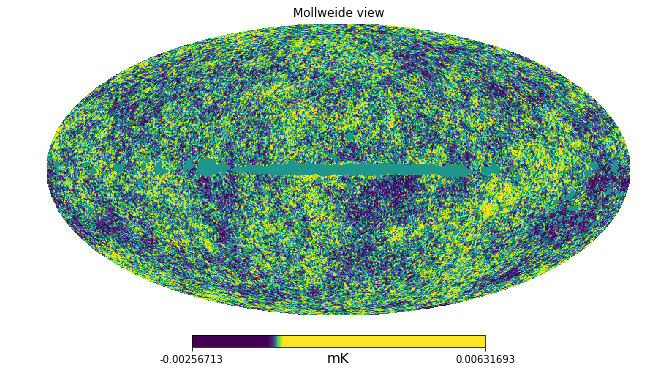

In [27]:
w_2048 = get_ilc_weights(m_2048)

m_f2 = get_final_map(m_2048, w_2048)
hp.mollview(m_f2,unit='mK', norm='hist')
plt.show()

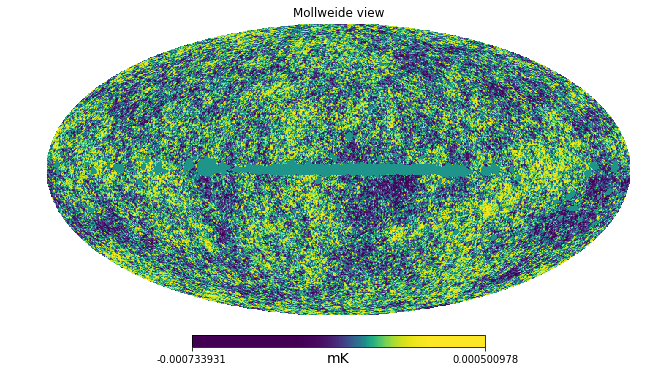

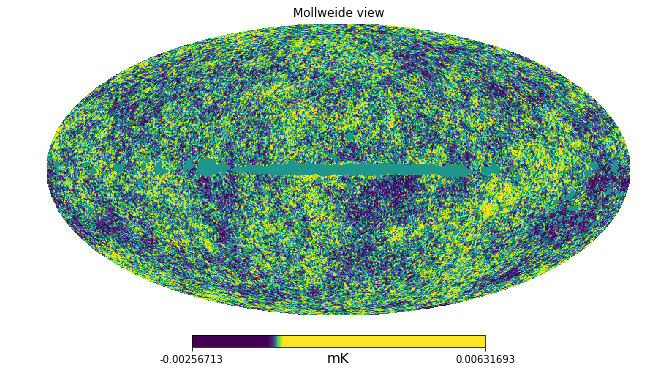

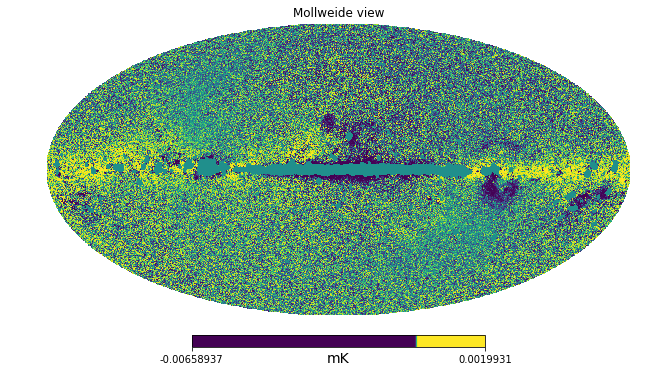

In [28]:
hp.mollview(m_off2,unit='mK', norm='hist')
plt.show()
hp.mollview(m_f2,unit='mK', norm='hist')
plt.show()
hp.mollview(m_off2-m_f2,unit='mK', norm='hist')
plt.show()